In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import folium
from folium.plugins import HeatMap
import plotly.express as px
import plotly.graph_objects as go
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Load the data
df = pd.read_csv('nyc_taxi_trip_duration.csv')

In [3]:
# Display basic information
print("Dataset Shape:", df.shape)
print("\nData Types:")
print(df.dtypes)
print("\nSummary Statistics:")
print(df.describe())

Dataset Shape: (729322, 11)

Data Types:
id                     object
vendor_id               int64
pickup_datetime        object
dropoff_datetime       object
passenger_count         int64
pickup_longitude      float64
pickup_latitude       float64
dropoff_longitude     float64
dropoff_latitude      float64
store_and_fwd_flag     object
trip_duration           int64
dtype: object

Summary Statistics:
           vendor_id  passenger_count  pickup_longitude  pickup_latitude  \
count  729322.000000    729322.000000     729322.000000    729322.000000   
mean        1.535403         1.662055        -73.973513        40.750919   
std         0.498745         1.312446          0.069754         0.033594   
min         1.000000         0.000000       -121.933342        34.712234   
25%         1.000000         1.000000        -73.991859        40.737335   
50%         2.000000         1.000000        -73.981758        40.754070   
75%         2.000000         2.000000        -73.967361       

In [4]:
# Check for missing values
print("\nMissing Values:")
print(df.isnull().sum())


Missing Values:
id                    0
vendor_id             0
pickup_datetime       0
dropoff_datetime      0
passenger_count       0
pickup_longitude      0
pickup_latitude       0
dropoff_longitude     0
dropoff_latitude      0
store_and_fwd_flag    0
trip_duration         0
dtype: int64


In [5]:
# Convert pickup and dropoff datetime strings to datetime objects
df['pickup_datetime'] = pd.to_datetime(df['pickup_datetime'])
df['dropoff_datetime'] = pd.to_datetime(df['dropoff_datetime'])

In [6]:
# Calculate trip duration in minutes (if not already in the dataset)
if 'trip_duration' not in df.columns:
    df['trip_duration'] = (df['dropoff_datetime'] - df['pickup_datetime']).dt.total_seconds()

In [7]:
# Extract time-based features
df['pickup_hour'] = df['pickup_datetime'].dt.hour
df['pickup_day'] = df['pickup_datetime'].dt.day_name()
df['pickup_month'] = df['pickup_datetime'].dt.month
df['pickup_dayofweek'] = df['pickup_datetime'].dt.dayofweek

In [8]:
# Calculate distance (if not already in the dataset)
if 'distance' not in df.columns:
    # Approximate distance calculation using Haversine formula
    def haversine_distance(lat1, lon1, lat2, lon2):
        R = 6371  # Earth radius in kilometers
        dLat = np.radians(lat2 - lat1)
        dLon = np.radians(lon2 - lon1)
        a = np.sin(dLat/2) * np.sin(dLat/2) + np.cos(np.radians(lat1)) * np.cos(np.radians(lat2)) * np.sin(dLon/2) * np.sin(dLon/2)
        c = 2 * np.arctan2(np.sqrt(a), np.sqrt(1-a))
        distance = R * c
        return distance

In [9]:
   df['distance'] = haversine_distance(
        df['pickup_latitude'],
        df['pickup_longitude'],
        df['dropoff_latitude'],
        df['dropoff_longitude']
    )


In [10]:
# Calculate speed (distance / duration)
df['speed'] = df['distance'] / (df['trip_duration'] / 3600)  # km/h

# Remove outliers
# For trip duration (e.g., trips longer than 3 hours or shorter than 10 seconds might be errors)
df = df[(df['trip_duration'] >= 10) & (df['trip_duration'] <= 10800)]

# For distance (e.g., trips longer than 100 km or with 0 distance might be errors)
df = df[(df['distance'] > 0) & (df['distance'] <= 100)]

# For speed (e.g., speeds higher than 100 km/h or 0 might be errors)
df = df[(df['speed'] > 0) & (df['speed'] <= 100)]

# For pickup and dropoff coordinates (remove trips outside NYC)
df = df[(df['pickup_latitude'] > 40.5) & (df['pickup_latitude'] < 41.0) &
        (df['pickup_longitude'] > -74.2) & (df['pickup_longitude'] < -73.7) &
        (df['dropoff_latitude'] > 40.5) & (df['dropoff_latitude'] < 41.0) &
        (df['dropoff_longitude'] > -74.2) & (df['dropoff_longitude'] < -73.7)]

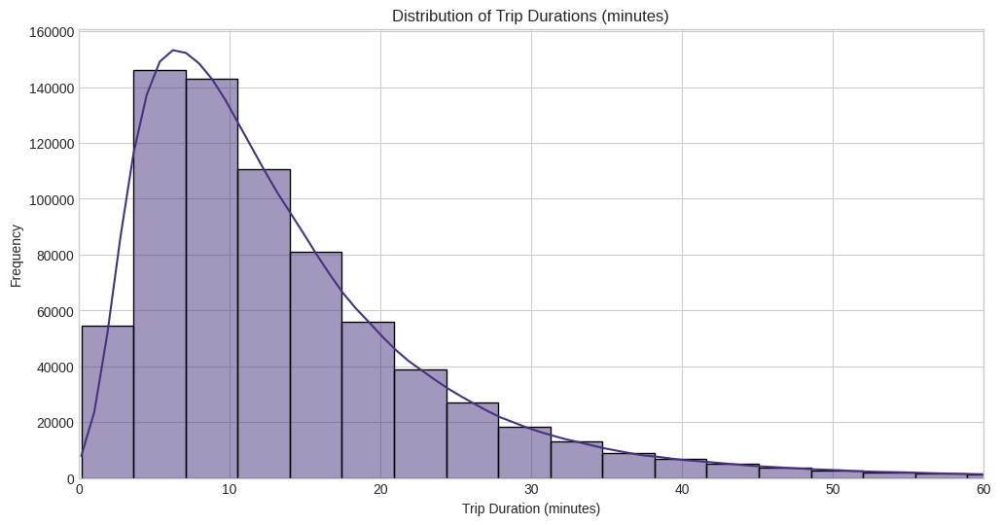

In [11]:
# Set plot style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("viridis")
plt.rcParams['figure.figsize'] = (14, 8)

# Distribution of trip durations
plt.figure(figsize=(12, 6))
sns.histplot(df['trip_duration'] / 60, bins=50, kde=True)
plt.title('Distribution of Trip Durations (minutes)')
plt.xlabel('Trip Duration (minutes)')
plt.ylabel('Frequency')
plt.xlim(0, 60)  # Limit x-axis to 1 hour for better visualization
plt.show()

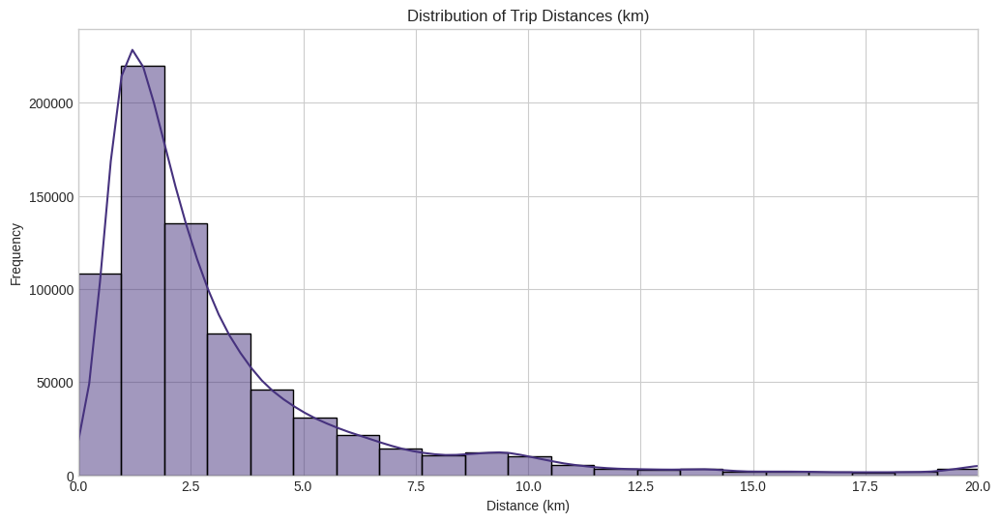

In [12]:
# Distribution of distances
plt.figure(figsize=(12, 6))
sns.histplot(df['distance'], bins=50, kde=True)
plt.title('Distribution of Trip Distances (km)')
plt.xlabel('Distance (km)')
plt.ylabel('Frequency')
plt.xlim(0, 20)  # Limit x-axis to 20 km for better visualization
plt.show()

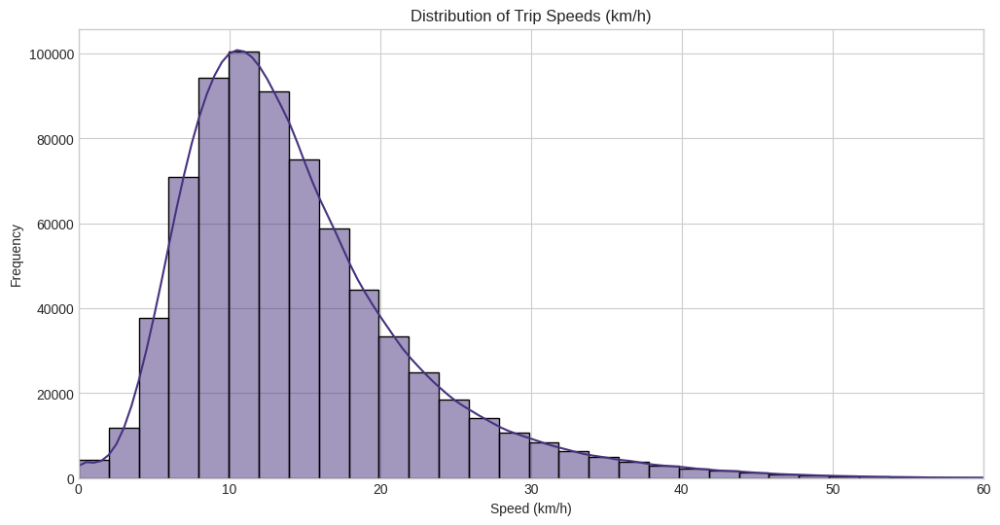

In [13]:
# Distribution of speeds
plt.figure(figsize=(12, 6))
sns.histplot(df['speed'], bins=50, kde=True)
plt.title('Distribution of Trip Speeds (km/h)')
plt.xlabel('Speed (km/h)')
plt.ylabel('Frequency')
plt.xlim(0, 60)  # Limit x-axis to 60 km/h for better visualization
plt.show()

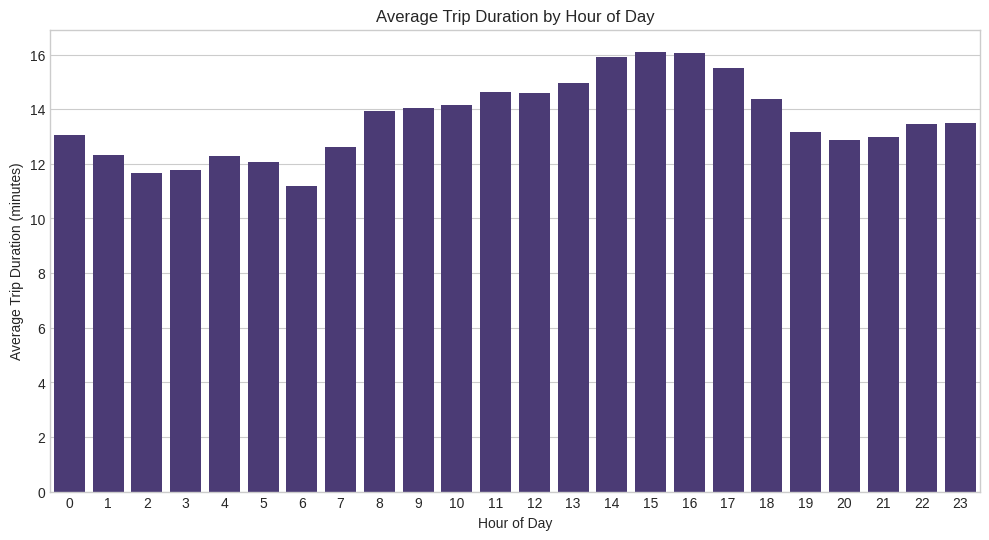

In [14]:
# Trip duration by hour of day
plt.figure(figsize=(12, 6))
hour_data = df.groupby('pickup_hour')['trip_duration'].mean() / 60
sns.barplot(x=hour_data.index, y=hour_data.values)
plt.title('Average Trip Duration by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Average Trip Duration (minutes)')
plt.xticks(range(0, 24))
plt.show()

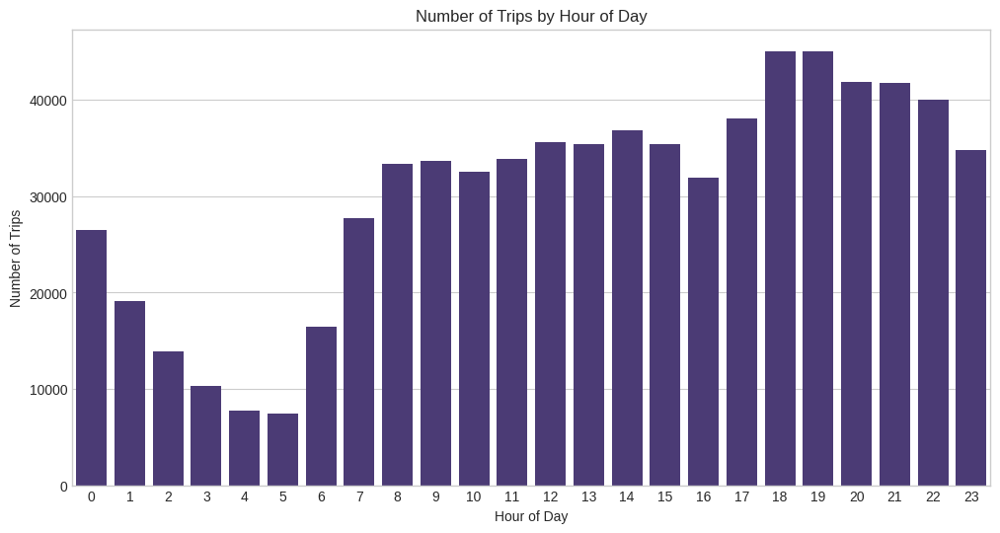

In [15]:
# Trip count by hour of day
plt.figure(figsize=(12, 6))
hour_count = df.groupby('pickup_hour').size()
sns.barplot(x=hour_count.index, y=hour_count.values)
plt.title('Number of Trips by Hour of Day')
plt.xlabel('Hour of Day')
plt.ylabel('Number of Trips')
plt.xticks(range(0, 24))
plt.show()

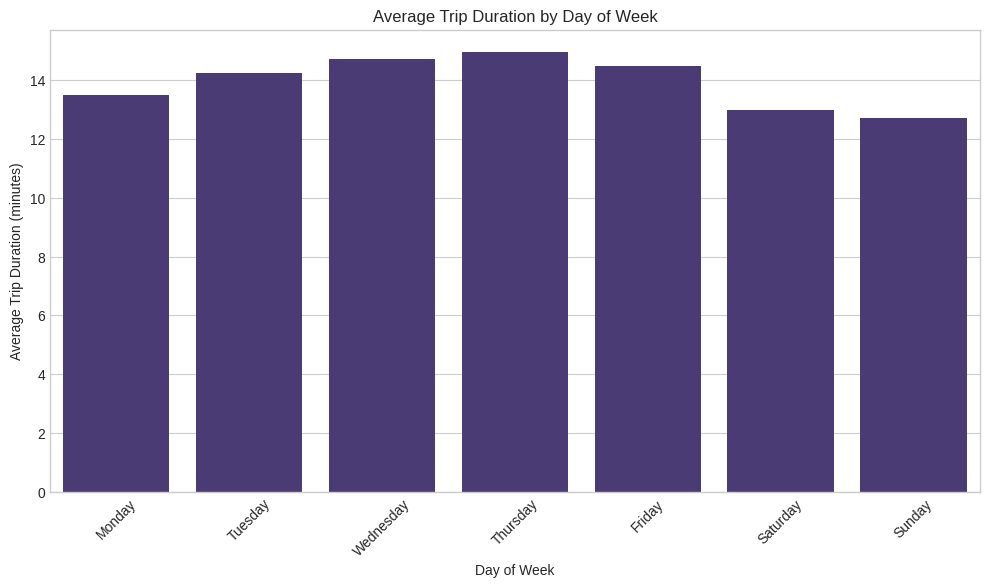

In [16]:
# Trip duration by day of week
plt.figure(figsize=(12, 6))
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
day_data = df.groupby('pickup_day')['trip_duration'].mean() / 60
day_data = day_data.reindex(day_order)
sns.barplot(x=day_data.index, y=day_data.values)
plt.title('Average Trip Duration by Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Average Trip Duration (minutes)')
plt.xticks(rotation=45)
plt.show()

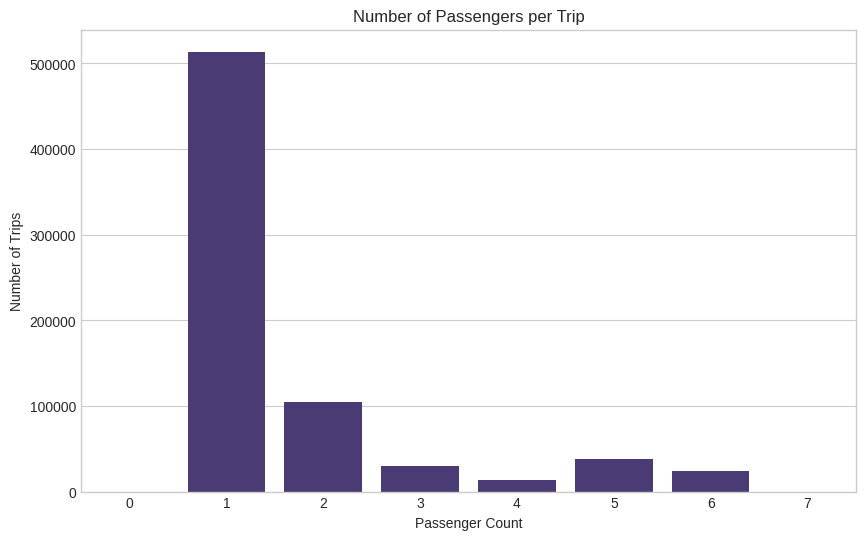

In [17]:
# Number of passengers distribution
plt.figure(figsize=(10, 6))
sns.countplot(x='passenger_count', data=df)
plt.title('Number of Passengers per Trip')
plt.xlabel('Passenger Count')
plt.ylabel('Number of Trips')
plt.show()

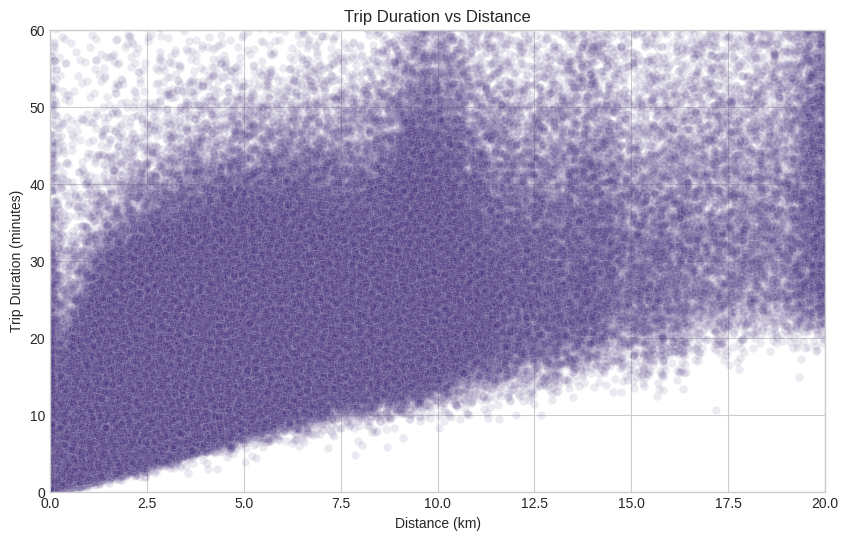

In [18]:
# Trip duration vs distance
plt.figure(figsize=(10, 6))
sns.scatterplot(x='distance', y=df['trip_duration'] / 60, data=df, alpha=0.1)
plt.title('Trip Duration vs Distance')
plt.xlabel('Distance (km)')
plt.ylabel('Trip Duration (minutes)')
plt.xlim(0, 20)
plt.ylim(0, 60)
plt.show()

In [21]:
# Create a sample for the heatmap (if the dataset is too large)
sample_size = min(10000, len(df))
df_sample = df.sample(sample_size, random_state=42)

# Pickup locations heatmap
pickup_map = folium.Map(location=[40.7580, -73.9855], zoom_start=12)
pickup_points = df_sample[['pickup_latitude', 'pickup_longitude']].values.tolist()
HeatMap(pickup_points).add_to(pickup_map)

# Dropoff locations heatmap
dropoff_map = folium.Map(location=[40.7580, -73.9855], zoom_start=12)
dropoff_points = df_sample[['dropoff_latitude', 'dropoff_longitude']].values.tolist()
HeatMap(dropoff_points).add_to(dropoff_map)

# Display maps in Colab - correct method
from IPython.display import HTML

# Display pickup map directly
display(HTML(pickup_map._repr_html_()))

# Display dropoff map directly
display(HTML(dropoff_map._repr_html_()))

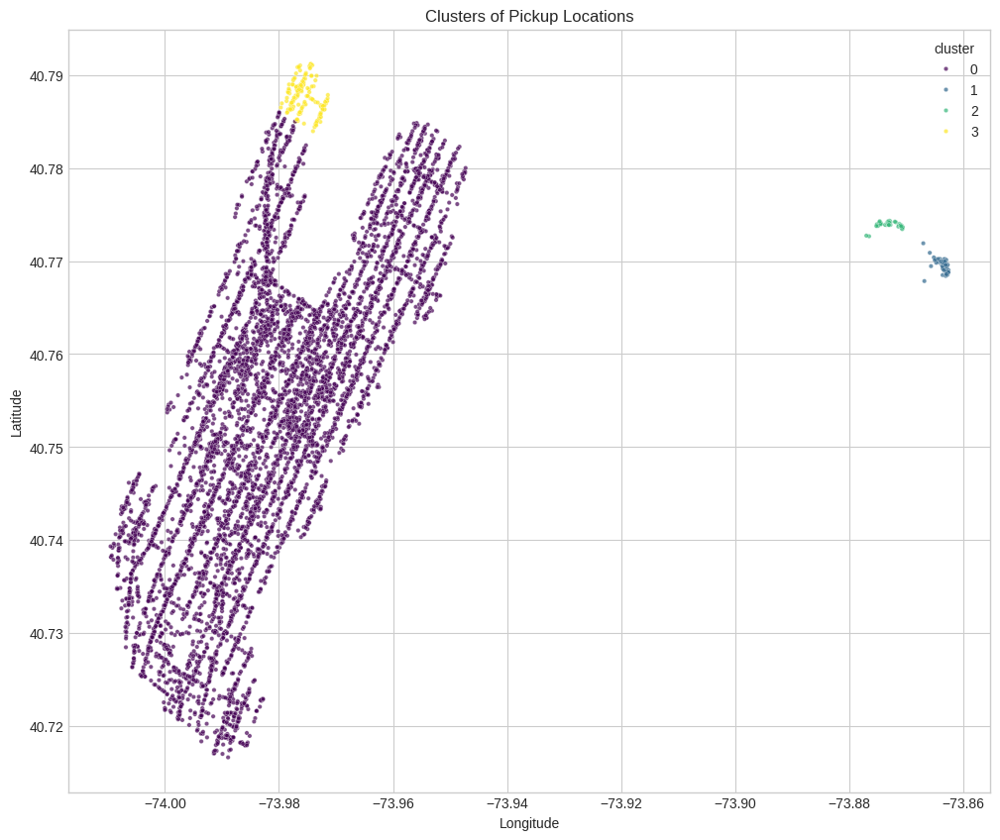

In [22]:
# Advanced analysis: Find clusters of pickup locations
coords = df_sample[['pickup_latitude', 'pickup_longitude']].values
# Normalize the coordinates
coords_normalized = StandardScaler().fit_transform(coords)
# Apply DBSCAN clustering
db = DBSCAN(eps=0.1, min_samples=100).fit(coords_normalized)
labels = db.labels_
df_sample['cluster'] = labels

# Visualize clusters
plt.figure(figsize=(12, 10))
sns.scatterplot(x='pickup_longitude', y='pickup_latitude',
                hue='cluster', data=df_sample[df_sample['cluster'] != -1],
                palette='viridis', s=10, alpha=0.7)
plt.title('Clusters of Pickup Locations')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

In [23]:
# Interactive visualization with Plotly for trip duration by hour and day
fig = px.box(df, x='pickup_hour', y=df['trip_duration'] / 60,
             color='pickup_day',
             title='Trip Duration by Hour and Day',
             labels={'pickup_hour': 'Hour of Day', 'y': 'Trip Duration (minutes)'},
             category_orders={'pickup_day': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']})
fig.update_layout(height=600, width=900)
fig.show()

In [24]:
# Interactive 3D scatter plot of pickup locations, colored by trip duration
fig = px.scatter_3d(df_sample, x='pickup_longitude', y='pickup_latitude', z=df_sample['trip_duration'] / 60,
                   color=df_sample['trip_duration'] / 60,
                   title='Pickup Locations by Trip Duration',
                   labels={'pickup_longitude': 'Longitude', 'pickup_latitude': 'Latitude', 'z': 'Trip Duration (min)'},
                   opacity=0.6)
fig.update_layout(height=700, width=900)
fig.show()

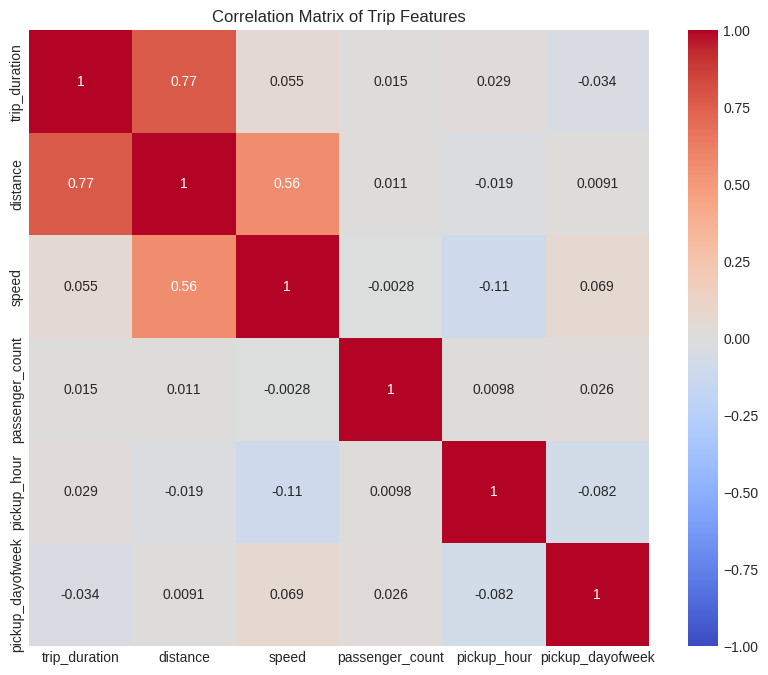

In [25]:
# Correlation matrix of numeric features
numeric_cols = ['trip_duration', 'distance', 'speed', 'passenger_count', 'pickup_hour', 'pickup_dayofweek']
corr_matrix = df[numeric_cols].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix of Trip Features')
plt.show()

In [26]:
# Top pickup-dropoff pairs (most common routes)
pickup_dropoff_pairs = df.groupby(['pickup_latitude', 'pickup_longitude',
                                  'dropoff_latitude', 'dropoff_longitude']).size().reset_index(name='count')
top_routes = pickup_dropoff_pairs.sort_values('count', ascending=False).head(10)
print("Top 10 Most Common Routes:")
print(top_routes)

Top 10 Most Common Routes:
        pickup_latitude  pickup_longitude  dropoff_latitude  \
0             40.520481        -73.745171         40.520344   
482869        40.763092        -73.973724         40.726147   
482805        40.763088        -73.977203         40.752228   
482806        40.763088        -73.976509         40.805599   
482807        40.763088        -73.974251         40.785927   
482808        40.763088        -73.973938         40.772861   
482809        40.763088        -73.973923         40.758091   
482810        40.763088        -73.973900         40.716789   
482811        40.763088        -73.973846         40.759869   
482812        40.763088        -73.973824         40.739948   

        dropoff_longitude  count  
0              -73.743622      1  
482869         -74.000481      1  
482805         -73.975929      1  
482806         -73.956528      1  
482807         -73.951027      1  
482808         -73.951790      1  
482809         -73.968079      1  

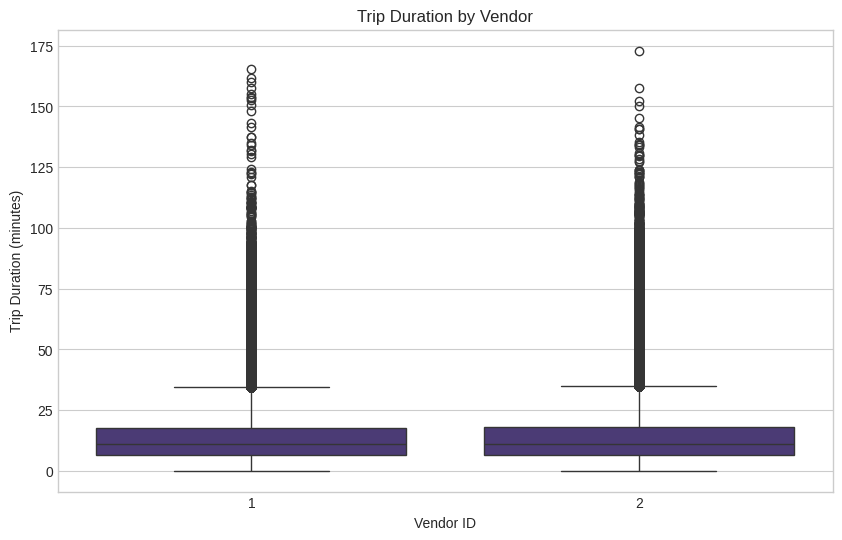

In [27]:
# Analyze trip duration by vendor
if 'vendor_id' in df.columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='vendor_id', y=df['trip_duration']/60, data=df)
    plt.title('Trip Duration by Vendor')
    plt.xlabel('Vendor ID')
    plt.ylabel('Trip Duration (minutes)')
    plt.show()